<a href="https://colab.research.google.com/github/anas2322/anas2322.github.io/blob/main/Recommendation_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 3.8 MB/s eta 0:00:00


In [ ]:
!pip install fuzzywuzzy

In [ ]:
!pip install lightfm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.4/316.4 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lightfm: filename=lightfm-1.17-cp310-cp310-linux_x86_64.whl size=808331 sha256=44f206f94f86efd4847019feacd782599a4c933ace6ffb20e7b5c125886abdb0
  Stored in directory: /root/.cache/pip/wheels/4f/9b/7e/0b256f2168511d8fa4dae4fae0200fdbd729eb424a912ad636
Successfully built lightfm


In [ ]:
# importing the necessary packages
import spotipy
sp = spotipy.Spotify()
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy.util as util

In [ ]:
import random
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy.util as util
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import gc
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from scipy.sparse import csr_matrix
import re
from nltk.corpus import stopwords
from fuzzywuzzy import fuzz, process
import seaborn as sns
import plotly.express as px
import lightfm
from lightfm import LightFM, cross_validation
from lightfm.evaluation import precision_at_k, auc_score
import warnings
warnings.filterwarnings("ignore")
import ast
from scipy.spatial.distance import cosine, euclidean, hamming
from sklearn.preprocessing import normalize
from keras.preprocessing import image
from math import sqrt

%matplotlib inline
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
from collections import defaultdict

/usr/local/lib/python3.10/dist-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [ ]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Data/data.csv')
genre_data = pd.read_csv('/content/drive/MyDrive/Data/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/Data/data_by_year.csv')
artist_data = pd.read_csv('/content/drive/MyDrive/Data/data_by_artist.csv')

In [ ]:
print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(artist_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              28680 non-null  int64  
 1   count             28680 non-null  int64  
 2   acousticness      28680 non-null  float64
 3   artists           28680 non-null  object 
 4   danceability      28680 non-null  float64
 5   duration_ms       28680 non-null  float64
 6   energy            28680 non-null  float64
 7   instrumentalness  28680 non-null  float64
 8   liveness          28680 non-null  float64
 9   loudness          28680 non-null  float64
 10  speechiness       28680 non-null  float64
 11  tempo             28680 non-null  float64
 12  valence           28680 non-null  float64
 13  popularity        28680 non-null  float64
 14  key               28680 non-null  int64  
dtypes: float64(11), int64(3), object(1)
memory usage: 3.3+ MB
None


In [ ]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [ ]:
data['artists'] = data['artists'].map(lambda x: x.lstrip('[').rstrip(']'))
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"'Sergei Rachmaninoff', 'James Levine', 'Berlin...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,'Dennis Day',0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,'KHP Kridhamardawa Karaton Ngayogyakarta Hadin...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,'Frank Parker',0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,'Phil Regan',0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [ ]:
data['artists'] = data['artists'].map(lambda x: x[1:-1])
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"Sergei Rachmaninoff', 'James Levine', 'Berline...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,Dennis Day,0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,Frank Parker,0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,Phil Regan,0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


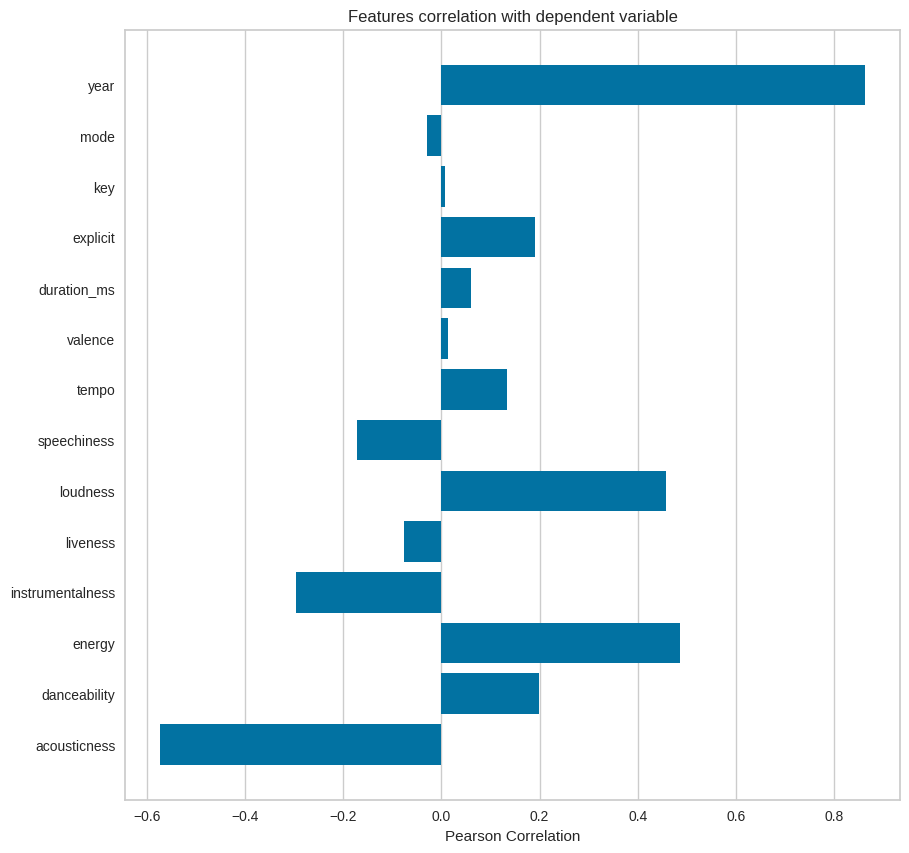

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(10,10)
visualizer.fit(X, y)
visualizer.show()

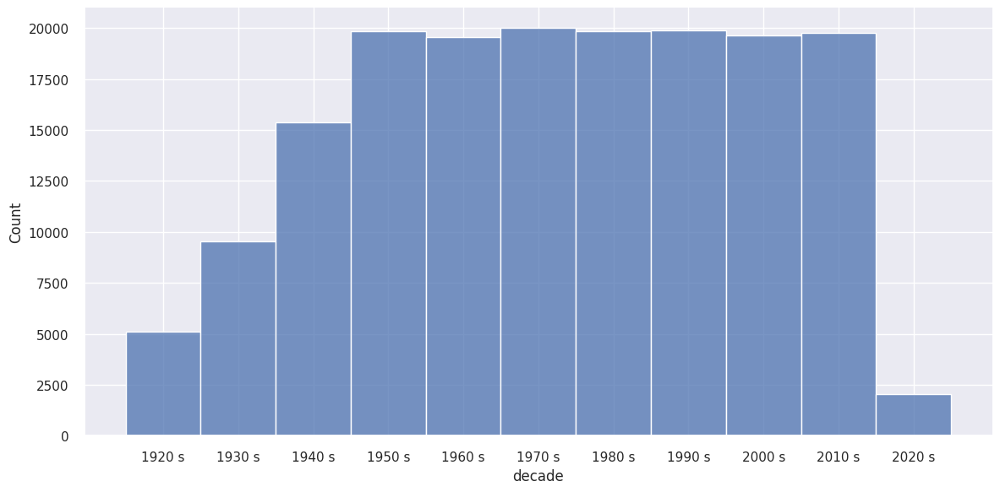

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{} s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(10, 6)})
sns.displot(data, x='decade', height=6, aspect=2)


In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [ ]:
fig = px.line(year_data, x='year', y='loudness',title='Loudness')
fig.show()

In [ ]:
top10_popular_artists = artist_data.nlargest(10, 'popularity')
top10_most_song_produced_artists = artist_data.nlargest(10, 'count')
print('Top 10 Artists that produced most songs:')
top10_most_song_produced_artists[['count','artists']].sort_values('count',ascending=False)

Top 10 Artists that produced most songs:


,count,artists
8367,3169,Francisco Canaro
28561,2422,Эрнест Хемингуэй
28560,2136,Эрих Мария Ремарк
8434,1459,Frank Sinatra
10714,1256,Ignacio Corsini
27109,1200,Vladimir Horowitz
1682,1146,Arturo Toscanini
2707,1103,Billie Holiday
12378,1061,Johnny Cash
7426,1023,Elvis Presley


In [ ]:
print('Top 10 Artists that had most popularity score:')
top10_popular_artists[['popularity','artists']].sort_values('popularity',ascending=False)

Top 10 Artists that had most popularity score:


,popularity,artists
20966,93.0,Ritt Momney
14354,92.0,Lele Pons
15070,90.0,Los Legendarios
11764,89.0,Jerry Di
7463,88.0,Emilee
23687,88.0,Surf Mesa
28263,88.0,salem ilese
213,87.0,A7S
2343,86.0,Beltito
14378,86.0,Lenny Santos


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=12))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)




In [ ]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


tsne_params = {
    'n_components': 2,
    'perplexity': 30,
    'learning_rate': 50,
    'verbose': 1,
    'random_state': 42
}


kmeans_params = {
    'n_clusters': 12
}


tsne_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('tsne', TSNE(**tsne_params))
])


kmeans_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(**kmeans_params))
])


genre_embedding = tsne_pipeline.fit_transform(X)
kmeans_pipeline.fit(genre_embedding)
genre_data['cluster'] = kmeans_pipeline.predict(genre_embedding)


projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'], title='Clusters of genres')
fig.show()


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.321s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106400
[t-SNE] KL divergence after 1000 iterations: 1.397149


In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=25,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
pca_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('PCA', PCA(
        n_components=2,
        random_state=50,
        svd_solver='auto',
        whiten=True,
        tol=0.0,
        iterated_power='auto',
        copy=True
    ))
])


song_embedding = pca_pipeline.fit_transform(X)


projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']





fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'],
    title='Clusters of songs')
fig.show()


In [ ]:
p = 0.02
df_playlist = pd.read_csv('/content/drive/MyDrive/Spotify Dataset/spotify_dataset.csv', error_bad_lines=False, warn_bad_lines=False, skiprows=lambda i: i>0 and random.random() > p)
df_playlist.head()

FileNotFoundError: ignored

In [ ]:
df_playlist.columns = df_playlist.columns.str.replace('"', '')
df_playlist.columns = df_playlist.columns.str.replace('name', '')
df_playlist.columns = df_playlist.columns.str.replace(' ', '')
df_playlist.columns

NameError: ignored

In [ ]:
df_playlist = df_playlist.groupby('artist').filter(lambda x : len(x)>=50)

NameError: ignored

In [ ]:
df_playlist = df_playlist[df_playlist.groupby('user_id').artist.transform('nunique') >= 10]

In [ ]:
size = lambda x: len(x)
df_freq = df_playlist.groupby(['user_id', 'artist']).agg('size').reset_index().rename(columns={0:'freq'})[['user_id', 'artist', 'freq']].sort_values(['freq'], ascending=False)
df_freq.head()

NameError: ignored

In [ ]:
df_artist = pd.DataFrame(df_freq["artist"].unique())
df_artist = df_artist.reset_index()
df_artist = df_artist.rename(columns={'index':'artist_id', 0:'artist'})
df_artist.head()

NameError: ignored

In [ ]:
from spotipy.oauth2 import SpotifyOAuth
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy.util as util

In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

client_id = '8763ff54e5f9456bbcf997b7cc94ef90'
client_secret = 'a80d314c6524418aa1b478832e165143'

# Create a Spotify client object with client ID and secret
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [ ]:

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

In [ ]:
def get_song_data(song, spotify_data):
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        print('Fetching song information from local dataset')
        return song_data

    except IndexError:
        print('Fetching song information from spotify dataset')
        return find_song(song['name'], song['year'])


In [ ]:
def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print(f"Warning: {song['name']} does not exist in Spotify or in database")
            continue
        song_vectors.append(song_data[number_cols].values)

    if not song_vectors:
        print("No valid songs found in list")
        return None

    song_matrix = np.array(song_vectors)
    return np.mean(song_matrix, axis=0)


In [ ]:
def flatten_dict_list(dict_list):
    flattened_dict = {}
    for d in dict_list:
        for k, v in d.items():
            if k not in flattened_dict:
                flattened_dict[k] = []
            flattened_dict[k].append(v)
    return flattened_dict

In [ ]:
def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')

    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
recommend_songs([{'name': 'Blinding Lights', 'year': 2019}],  data)

Fetching song information from spotify dataset


[{'name': 'Best News Ever', 'year': 2017, 'artists': 'MercyMe'},
 {'name': 'Bit By Bit', 'year': 2012, 'artists': 'Mother Mother'},
 {'name': 'A Different World (feat. Corey Taylor)',
  'year': 2016,
  'artists': "Korn', 'Corey Taylor"},
 {'name': 'Sober', 'year': 2015, 'artists': 'Selena Gomez'},
 {'name': "Don't Say Goodnight", 'year': 2014, 'artists': 'Hot Chelle Rae'},
 {'name': 'Sight of the Sun - Single Version',
  'year': 2014,
  'artists': 'fun.'},
 {'name': 'Hotel Ceiling', 'year': 2014, 'artists': 'Rixton'},
 {'name': "Somethin' Bad (with Carrie Underwood) - (Duet with Carrie Underwood)",
  'year': 2014,
  'artists': "Miranda Lambert', 'Carrie Underwood"},
 {'name': 'We Go Together Like', 'year': 2020, 'artists': 'Abby Anderson'},
 {'name': 'Re-Do', 'year': 2012, 'artists': 'Modern Baseball'}]

In [ ]:
recommend_songs([{'name': 'Shirt', 'year': 2022}],  data)

Fetching song information from spotify dataset


[{'name': 'Like That (feat. Gucci Mane)',
  'year': 2019,
  'artists': "Doja Cat', 'Gucci Mane"},
 {'name': 'Know My Rights (feat. Lil Baby)',
  'year': 2020,
  'artists': "6LACK', 'Lil Baby"},
 {'name': 'Money Longer', 'year': 2016, 'artists': 'Lil Uzi Vert'},
 {'name': 'The Bakery', 'year': 2020, 'artists': 'Melanie Martinez'},
 {'name': 'Lemonade (Feat. Roddy Ricch & Don Toliver) [Remix]',
  'year': 2020,
  'artists': "Internet Money', 'Don Toliver', 'Roddy Ricch"},
 {'name': 'Lemonade (feat. Gunna, Don Toliver & NAV)',
  'year': 2020,
  'artists': "Internet Money', 'Gunna', 'Don Toliver', 'NAV"},
 {'name': 'Lemonade (feat. Gunna, Don Toliver & NAV)',
  'year': 2020,
  'artists': "Internet Money', 'Gunna', 'Don Toliver', 'NAV"},
 {'name': 'Jet Lag (feat. Young Scooter)',
  'year': 2018,
  'artists': "Future', 'Juice WRLD', 'Young Scooter"},
 {'name': 'sex money feelings die - slowed version',
  'year': 2019,
  'artists': 'Lykke Li'},
 {'name': 'Crew (feat. Brent Faiyaz & Shy Glizzy)

In [ ]:
recommend_songs([{'name': 'One and Only', 'year':2011}],  data)

Fetching song information from spotify dataset


[{'name': 'Yellow Ledbetter', 'year': 2003, 'artists': 'Pearl Jam'},
 {'name': 'A Little Bit Of Everything', 'year': 2011, 'artists': 'Dawes'},
 {'name': 'Stand Alone', 'year': 2015, 'artists': 'Morgan Wallen'},
 {'name': "Como Yo Nadie Te Ha Amado (This Ain't a Love Song)",
  'year': 2006,
  'artists': 'Yuridia'},
 {'name': 'The Day You Said Goodnight', 'year': 2005, 'artists': 'Hale'},
 {'name': 'Shine', 'year': 1994, 'artists': 'Collective Soul'},
 {'name': 'Acompáñame a Estar Solo',
  'year': 2005,
  'artists': 'Ricardo Arjona'},
 {'name': 'Everglow', 'year': 2015, 'artists': 'Coldplay'},
 {'name': 'Luz Sin Gravedad', 'year': 2006, 'artists': 'Belinda'},
 {'name': 'Let Go', 'year': 2002, 'artists': 'Frou Frou'}]

In [ ]:
recommend_songs([{'name': 'Yellow Ledbetter', 'year':2003}],  data)

Fetching song information from local dataset


[{'name': 'Te Dejo en Libertad', 'year': 2012, 'artists': 'Ha*Ash'},
 {'name': 'You Love Me Anyway', 'year': 2009, 'artists': 'Sidewalk Prophets'},
 {'name': 'I Always Wanna Die (Sometimes)',
  'year': 2018,
  'artists': 'The 1975'},
 {'name': 'La Gloria de Dios (feat. Evaluna Montaner)',
  'year': 2013,
  'artists': "Ricardo Montaner', 'Evaluna Montaner"},
 {'name': 'De Haber Sabido', 'year': 2004, 'artists': 'Marco Antonio Solís'},
 {'name': 'Man Of Sorrows - Live',
  'year': 2013,
  'artists': 'Hillsong Worship'},
 {'name': "You're Not Sorry", 'year': 2008, 'artists': 'Taylor Swift'},
 {'name': 'In Christ Alone - Live',
  'year': 2013,
  'artists': "Passion', 'Kristian Stanfill"},
 {'name': "Hard to Say I'm Sorry / Get Away - 2005 Remaster",
  'year': 2005,
  'artists': 'Chicago'}]

In [ ]:
recommend_songs([{'name': 'Ramana', 'year':2006}],  data)

Fetching song information from spotify dataset


[{'name': 'Oh, Angeline', 'year': 2012, 'artists': 'Shoes'},
 {'name': "If I Can't Have You", 'year': 2020, 'artists': 'Shawn Mendes'},
 {'name': 'คืนเหงาๆ',
  'year': 2013,
  'artists': "Ake Surachet', 'Various Artists"},
 {'name': 'Kubera Dhyaan Moolmantra', 'year': 2012, 'artists': 'Uma Mohan'},
 {'name': "Don't You Worry Child",
  'year': 2013,
  'artists': "Worry Child Band', 'Flash Ki"},
 {'name': "High Rollin' (Live)", 'year': 2018, 'artists': 'Brother Yusef'},
 {'name': 'Justicia',
  'year': 1969,
  'artists': "Eddie Palmieri', 'Ismael Quintana"},
 {'name': 'No Hay Amigo', 'year': 1974, 'artists': 'Orquesta Harlow'},
 {'name': 'Torn in Two', 'year': 2012, 'artists': 'Shoes'},
 {'name': 'I Wish You Love, Pt. 2', 'year': 1971, 'artists': 'Joe Bataan'}]

In [ ]:
recommend_songs([{'name': 'Se Preparó', 'year':2017}],  data)

Fetching song information from local dataset


[{'name': 'La Bicicleta', 'year': 2017, 'artists': "Carlos Vives', 'Shakira"},
 {'name': 'La Boca', 'year': 2019, 'artists': "Mau y Ricky', 'Camilo"},
 {'name': 'Infeliz', 'year': 2019, 'artists': "Arcangel', 'Bad Bunny"},
 {'name': 'Bitches', 'year': 2018, 'artists': 'Mitchell Tenpenny'},
 {'name': 'Waiting On the World to Change',
  'year': 2006,
  'artists': 'John Mayer'},
 {'name': 'Miss Independent', 'year': 2008, 'artists': 'Ne-Yo'},
 {'name': 'Rolex', 'year': 2017, 'artists': 'Ayo & Teo'},
 {'name': 'Broken Up', 'year': 2020, 'artists': 'Mitchell Tenpenny'},
 {'name': 'Lately', 'year': 2018, 'artists': "Forrest.', 'Biskwiq', 'Ryce"}]

In [ ]:
recommend_songs([{'name': 'Red', 'year':2020}],  data)

Fetching song information from spotify dataset


[{'name': 'Tell Me U Luv Me (with Trippie Redd)',
  'year': 2020,
  'artists': "Juice WRLD', 'Trippie Redd"},
 {'name': 'Burbujas de Cristal',
  'year': 2019,
  'artists': "Cartel De Santa', 'Millonario"},
 {'name': 'Personal Favorite (feat. Rich The Kid)',
  'year': 2020,
  'artists': "Trippie Redd', 'Rich The Kid"},
 {'name': 'Gasoline', 'year': 2019, 'artists': 'I Prevail'},
 {'name': 'Might Be', 'year': 2014, 'artists': 'Anderson .Paak'},
 {'name': 'WDYW',
  'year': 2015,
  'artists': "Carnage', 'Lil Uzi Vert', 'A$AP Ferg', 'Rich The Kid"},
 {'name': 'Venom - Music From The Motion Picture',
  'year': 2018,
  'artists': 'Eminem'},
 {'name': 'Fuck It Up (feat. YG)', 'year': 2016, 'artists': "Kamaiyah', 'YG"},
 {'name': 'Sarcophagus III',
  'year': 2016,
  'artists': "$uicideBoy$', 'Ramirez"},
 {'name': 'Time of Our Lives', 'year': 2014, 'artists': "Pitbull', 'Ne-Yo"}]

In [ ]:
recommend_songs([{'name': 'all mine ', 'year': 2022}],  data)

Fetching song information from spotify dataset


[{'name': 'Moral of the Story', 'year': 2019, 'artists': 'Ashe'},
 {'name': 'Swang', 'year': 2016, 'artists': 'Rae Sremmurd'},
 {'name': 'Moral of the Story (feat. Niall Horan)',
  'year': 2020,
  'artists': "Ashe', 'Niall Horan"},
 {'name': 'Better Now', 'year': 2018, 'artists': 'Post Malone'},
 {'name': 'Candy', 'year': 2018, 'artists': 'Doja Cat'},
 {'name': 'Hurt Feelings', 'year': 2018, 'artists': 'Mac Miller'},
 {'name': 'Love Me Later', 'year': 2015, 'artists': 'Natasha Mosley'},
 {'name': 'White Iverson', 'year': 2016, 'artists': 'Post Malone'},
 {'name': 'Hell & Back', 'year': 2012, 'artists': 'Kid Ink'},
 {'name': 'Drama (feat. Drake)',
  'year': 2015,
  'artists': "Roy Woods', 'Drake"}]

In [ ]:
recommend_songs([{'name': 'Como habla una mujer', 'year':2020},
                {'name': 'Mi historia entre tus dedos ', 'year': 1995},
                {'name': 'DE CAROLINA', 'year': 2022},
                {'name': 'Gatúbela', 'year': 2022},
                {'name': 'Ojitos lindos', 'year': 2022}],  data)

Fetching song information from spotify dataset
Fetching song information from spotify dataset
Fetching song information from spotify dataset
Fetching song information from spotify dataset
Fetching song information from spotify dataset


[{'name': 'Feel Invincible', 'year': 2016, 'artists': 'Skillet'},
 {'name': 'DDU-DU DDU-DU', 'year': 2018, 'artists': 'BLACKPINK'},
 {'name': 'Maria', 'year': 2020, 'artists': 'Hwa Sa'},
 {'name': 'Ride It - Jonas Blue Remix',
  'year': 2019,
  'artists': "Regard', 'Jonas Blue"},
 {'name': 'Wild Ones (feat. Sia)', 'year': 2012, 'artists': "Flo Rida', 'Sia"},
 {'name': "Don't Leave Me", 'year': 2018, 'artists': 'BTS'},
 {'name': 'Culpables', 'year': 2018, 'artists': "KAROL G', 'Anuel AA"},
 {'name': 'BANG BANG BANG', 'year': 2016, 'artists': 'BIGBANG'},
 {'name': 'HOME', 'year': 2019, 'artists': 'BTS'},
 {'name': 'Party Rock Anthem',
  'year': 2011,
  'artists': "LMFAO', 'Lauren Bennett', 'GoonRock"}]